#####**This notebook was run using google colab so all file paths are according to that, please modify the file paths according to your system**


In [1]:
%matplotlib inline

# To manipulate images
import numpy as np

# OpenCV library for computer vision
import cv2 as cv2

# for io.imread
from skimage import io

# plotting
from matplotlib import pyplot as plt
from matplotlib import colors

# For some useful mathetmatical constants
import math

# For some colour based operations
import colorsys

In [2]:
# File path for a sample image, change according to your experiment
living_room_image1_path = 'demoImgRot.jpg'

# Define RGB color ranges
# Note: OpenCV uses BGR format
lower_red = np.array([100, 0, 0])
upper_red = np.array([255, 80, 85])
lower_green = np.array([0, 0, 0])
upper_green = np.array([55, 255, 55])

# Dictionary to store the boundary improvement threshold for all the colours
colour_thresholds = {}
colour_thresholds['red'] = 31
colour_channel_index_dict = {}
colour_channel_index_dict['red'] = 0

# Dictionary to store the index of the 3 primary colours in rgb vector
colour_to_colour_range_dict = {}
colour_to_colour_range_dict['red'] = (lower_red, upper_red)
colour_to_colour_range_dict['green'] = (lower_green, upper_green)

# Default area limits for object detection
area_lower_limit = 100
area_upper_limit = 10000

# Considering radius values from 1 to 10 in the left and right directions
radius_range = range(1, 11)

# Left directions range
left_dx = [0, -1, -1, -1]
left_dy = [-1, -1, 0, 1]

# Right directions range
right_dx = [0, 1, 1, 1]
right_dy = [1, 1, 0, -1]

# File path for writing the detections
object_detections_file_path = '/content/object_detections.txt'

# File path for writing the object removed image
object_removed_image_file_path = '/content/object_removed_image.jpg'

In [3]:
# Util function to dispaly an image on google colab
def imshow(images, titles, nrows = 0, ncols=0, figsize = (15,20)):
    """Plot a multiple images with titles.

    Parameters
    ----------
    images : image list
    titles : title list
    ncols : number of columns of subplots wanted in the display
    nrows : number of rows of subplots wanted in the figure
    """

    if ncols == 0 and nrows == 0:
      ncols = len(images)
      nrows = 1
    if ncols == 0:
      ncols = len(images) // nrows
    if nrows == 0:
      nrows = len(images) // ncols

    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows, squeeze=False, figsize = figsize)
    for i, image in enumerate(images):
        axeslist.ravel()[i].imshow(image, cmap=plt.gray(), vmin=0, vmax=255)
        axeslist.ravel()[i].set_title(titles[i])
        axeslist.ravel()[i].set_axis_off()
    plt.tight_layout() # optional

In [4]:
# Util function to write the detections list to a file
def write_object_detections_to_text_file(object_detections, file_path):
  with open(file_path, 'w') as object_detections_file:
    for detection in object_detections:

      # Detection format: ((center_x, center_y), radius)
      center_x, center_y, radius = detection[0][0], detection[0][1], detection[1]

      line_str = str(center_y) + ' ' + str(center_x) + ' ' + str(radius)
      object_detections_file.write('%s\n' % line_str)

In [5]:
# Util function to compute if a rgb vector is close to pure red according to hsv
def is_close_to_red(rgb, threshold):
  r, g, b = [x / 255.0 for x in rgb]
  h, s, v = colorsys.rgb_to_hsv(r, g, b)
  h *= 360
  return (h < threshold or h > 360 - threshold) and s > 0.5

In [6]:
# Util function to create a binary mask based on colour range
def create_mask(image, lower_color, upper_color):
    mask = cv2.inRange(image, lower_color, upper_color)
    return mask

In [7]:
# Function to detect circular objects in a given image
def detect_circular_object_according_to_colour(image, colour, custom_area_lower_limit = None, custom_area_upper_limit = None):
  image_copy = image.copy()
  detections = []

  # If no custom area limit is provided, use the default values
  if (custom_area_lower_limit is None):
    custom_area_lower_limit = area_lower_limit

  if (custom_area_upper_limit is None):
    custom_area_upper_limit = area_upper_limit

  # Get the lower and upper bounds for a given colour
  colour_lower_bound, colour_upper_bound = colour_to_colour_range_dict[colour][0], colour_to_colour_range_dict[colour][1]

  # Create the colour mask according to the input colour
  colour_mask = create_mask(image_copy, colour_lower_bound, colour_upper_bound)

  # Apply gaussian blur to smoothen the image for better in-painting
  blurred = cv2.blur(colour_mask, (30, 30), cv2.BORDER_DEFAULT)
  ret, threshed = cv2.threshold(blurred, 80, 255, cv2.THRESH_BINARY)

  colour_mask = threshed

  # Apply Hough Circle Transform to find circles
  circles = cv2.HoughCircles(colour_mask, cv2.HOUGH_GRADIENT, 1, 20, param1=10, param2=10, minRadius=0, maxRadius=0)
  circles = np.uint16(np.around(circles))

  # Filter circles based on area and position
  for circle in circles[0, :]:
    center = (circle[0], circle[1])
    radius = circle[2]
    area = math.pi * (radius ** 2)
    if (custom_area_lower_limit <= area and area <= custom_area_upper_limit):
      detections.append((center, radius))

  return detections, colour_mask

In [8]:
# Function to detect objects of any shape in a given image
def detect_rectangular_object_according_to_colour(image, colour, custom_area_lower_limit = None, custom_area_upper_limit = None):
  image_copy = image.copy()
  detections = []

  # If no custom area limit is provided, use the default values
  if (custom_area_lower_limit is None):
    custom_area_lower_limit = area_lower_limit

  if (custom_area_upper_limit is None):
    custom_area_upper_limit = area_upper_limit

  # Get the lower and upper bounds for a given colour
  colour_lower_bound, colour_upper_bound = colour_to_colour_range_dict[colour][0], colour_to_colour_range_dict[colour][1]

  # Create the colour mask according to the input colour
  colour_mask = create_mask(image_copy, colour_lower_bound, colour_upper_bound)

  # Apply gaussian blur to smoothen the image for better in-painting
  blurred = cv2.blur(colour_mask, (30, 30), cv2.BORDER_DEFAULT)
  ret, threshed = cv2.threshold(blurred, 70, 255, cv2.THRESH_BINARY)

  colour_mask = threshed

  # Find contours according to the colour mask
  contours, _ = cv2.findContours(colour_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

  # Filter contours based on area and position
  for contour in contours:
    area = cv2.contourArea(contour)
    if (custom_area_lower_limit <= area and area <= custom_area_upper_limit):
      x, y, w, h = cv2.boundingRect(contour)
      detections.append((x, y, w, h))

  return detections, colour_mask

In [9]:
# Wrapper function to decide which type of object detection needs to be done
def detect_object_according_to_colour(image, colour, method, custom_area_lower_limit = None, custom_area_upper_limit = None):
  if (method == 'rect'):
    return detect_rectangular_object_according_to_colour(image, colour, custom_area_lower_limit, custom_area_upper_limit)
  else:

    # Default is kept as circular detections because of constrained domain of circular objects in our project
    return detect_circular_object_according_to_colour(image, colour, custom_area_lower_limit, custom_area_upper_limit)

In [10]:
# Function to improve the detections of objects of any shape in a rectangular bounding box
# by radially expanding the boundary of the bounding box
# Reference: Detecting red-lesions from retinal fundus images using unique morphological features
def improve_detections(image, detections, colour):
  improved_detections = []
  for bounding_rect in detections:
    # Maximum values on the left and right of the bounding box by which the bounding box
    # should be expanded in that direction
    max_left_radius = 0
    max_right_radius = 0

    x, y, w, h = bounding_rect[0], bounding_rect[1], bounding_rect[2], bounding_rect[3]
    top_left = (x, y)
    bottom_right = (x + w, y + h)
    for radius in radius_range:

      # Left side of top left corner of bounding box
      for itr in range(len(left_dx)):
        new_x, new_y = x + (left_dx[itr] * radius), y + (left_dy[itr] * radius)
        if (new_x >= 0 and new_y >= 0 and new_y < image.shape[0]):
          center_rgb = image[y, x]
          boundary_rgb = image[new_y, new_x]

          # Using euclidean distance to compute colour distance, we can also use hsv for improving detections
          # hsv based distance calculates colour distance based on visual properties
          # Comment this code block and use the commented code in case you want to use hsv based distance metric
          if (np.linalg.norm(center_rgb - boundary_rgb) < colour_thresholds[colour]):
            if (radius > max_left_radius):
              max_left_radius = max(max_left_radius, radius)
              top_left = (new_x, new_y)

          # Use below code instead to use hsv_based boundary improvement
          # boundary_rgb = image[new_y, new_x]
          # if (is_close_to_red(boundary_rgb.tolist(), colour_thresholds[colour])):
          #   if (radius > max_left_radius):
          #     max_left_radius = max(max_left_radius, radius)
          #     top_left = (new_x, new_y)

      # Right side of top left corner of bounding box
      for itr in range(len(right_dx)):
        new_x, new_y = x + (right_dx[itr] * radius) + w, y + (right_dy[itr] * radius) + h
        if (new_x < image.shape[1] and new_y >= 0 and new_y < image.shape[0]):
          center_rgb = image[y + h, x + w]
          boundary_rgb = image[new_y, new_x]

          # Using euclidean distance to compute colour distance, we can also use hsv for improving detections
          # hsv based distance calculates colour distance based on visual properties
          # Comment this code block and use the commented code in case you want to use hsv based distance metric
          if (np.linalg.norm(center_rgb - boundary_rgb) < colour_thresholds[colour]):
            if (radius > max_right_radius):
              max_right_radius = max(max_right_radius, radius)
              bottom_right = (new_x, new_y)

          # Use below code instead to use hsv_based boundary improvement
          # boundary_rgb = image[new_y, new_x]
          # if (is_close_to_red(boundary_rgb.tolist(), colour_thresholds[colour])):
          #   if (radius > max_right_radius):
          #     max_right_radius = max(max_right_radius, radius)
          #     bottom_right = (new_x, new_y)

    # Populating improved detections
    new_w, new_h = bottom_right[0] - top_left[0], bottom_right[1] - top_left[1]
    improved_detections.append((top_left[0], top_left[1], new_w, new_h))

  return improved_detections

In [11]:
# Util function to display circular detections
def display_circular_detected_objects(image, detections):
  detected_object_img = image.copy()

  if detections is not None:
    for circle in detections:
      center, radius = circle[0], circle[1]

      # Draw the bounding circle
      cv2.circle(detected_object_img, center, radius, (0, 255, 0), 2)

  imshow([detected_object_img], ['Detected Object Image Circular box'])

In [12]:
# Util function to display detections in a rectangular bounding box
def display_rectangular_detected_objects(image, detections):
  detected_object_img = image.copy()

  if detections is not None:
    for bbox in detections:
      x, y, w, h = bbox[0], bbox[1], bbox[2], bbox[3]

      # Draw the bounding box
      cv2.rectangle(detected_object_img, (x, y), (x + w, y + h), (0, 255, 0), 2)

  imshow([detected_object_img], ['Detected Object Image Rectangular box'])

In [13]:
# Wrapper function to decide how the detections should be displayed
def display_detected_objects(image, detections, method):
  if (method == 'rect'):
    display_rectangular_detected_objects(image, detections)
  else:

    # Default method as circular because domain is constrained for only circular objects for this project
    display_circular_detected_objects(image, detections)

In [14]:
# Util function to create an in-painting mask for given bounding boxes
def create_rectangular_object_removal_mask(image, bounding_rectangles):
  object_removal_mask = np.zeros((image.shape[0], image.shape[1]))
  for bounding_rectangle in bounding_rectangles:
    x, y, w, h = bounding_rectangle[0], bounding_rectangle[1], bounding_rectangle[2], bounding_rectangle[3]
    x_min, y_min, x_max, y_max = x, y, x + w, y + h
    object_removal_mask[y_min: y_max, x_min: x_max] = 255
  return object_removal_mask.astype(np.uint8)

In [15]:
# Util function to create an in-painting mask for a given bounding circles
def create_circular_object_removal_mask(image, circles):
  object_removal_mask = np.zeros((image.shape[0], image.shape[1]))
  for circle in circles:
    center, radius = circle[0], circle[1]

    # Thickness = -1 so that entire circle is filled, colour = (255, 255, 255) so that white colour is filled
    cv2.circle(object_removal_mask, center, radius, (255, 255, 255), thickness = -1)

  return object_removal_mask.astype(np.uint8)

In [16]:
# Function to remove objects within rectangular bounding boxes using in-painting
def remove_rectangular_object_from_image(input_image, bbox):

  # Create bit array mask to find the region where in-painting needs to be done
  object_removal_mask = create_rectangular_object_removal_mask(input_image, bbox)

  # Dilate the region boundary (Optional)
  dilation_kernel = np.ones((3, 3), np.uint8)
  dilated_obj_removal_mask = cv2.dilate(object_removal_mask, dilation_kernel, iterations = 1)

  # Remove object using in-painting
  sample_image_inpaint_dilated = input_image.copy()
  sample_image_inpaint_dilated = cv2.inpaint(sample_image_inpaint_dilated, dilated_obj_removal_mask, 10, cv2.INPAINT_NS)

  return sample_image_inpaint_dilated

In [17]:
# Function to remove objects within circular boundaries using in-painting
def remove_circular_object_from_image(input_image, circles):

  # Create bit array mask to find the region where in-painting needs to be done
  object_removal_mask = create_circular_object_removal_mask(input_image, circles)

  # Remove object using in-painting
  sample_image_inpaint = input_image.copy()
  sample_image_inpaint = cv2.inpaint(sample_image_inpaint, object_removal_mask, 10, cv2.INPAINT_TELEA)

  return sample_image_inpaint

In [18]:
# Wrapper function to decide which object removal method should be used
def remove_object_from_image(input_image, detections, method):
  if (method == 'rect'):
    return remove_rectangular_object_from_image(input_image, detections)
  else:

    # Default to circular because domain is restricted to circular objects
    return remove_circular_object_from_image(input_image, detections)

In [19]:
# Util function to perform in-painting by directly inputting object removal mask
def remove_object_from_image_with_custom_removal_mask(input_image, removal_mask):

  # Remove object using in-painting
  sample_image_inpaint = input_image.copy()
  sample_image_inpaint = cv2.inpaint(sample_image_inpaint, removal_mask, 10, cv2.INPAINT_NS)

  return sample_image_inpaint

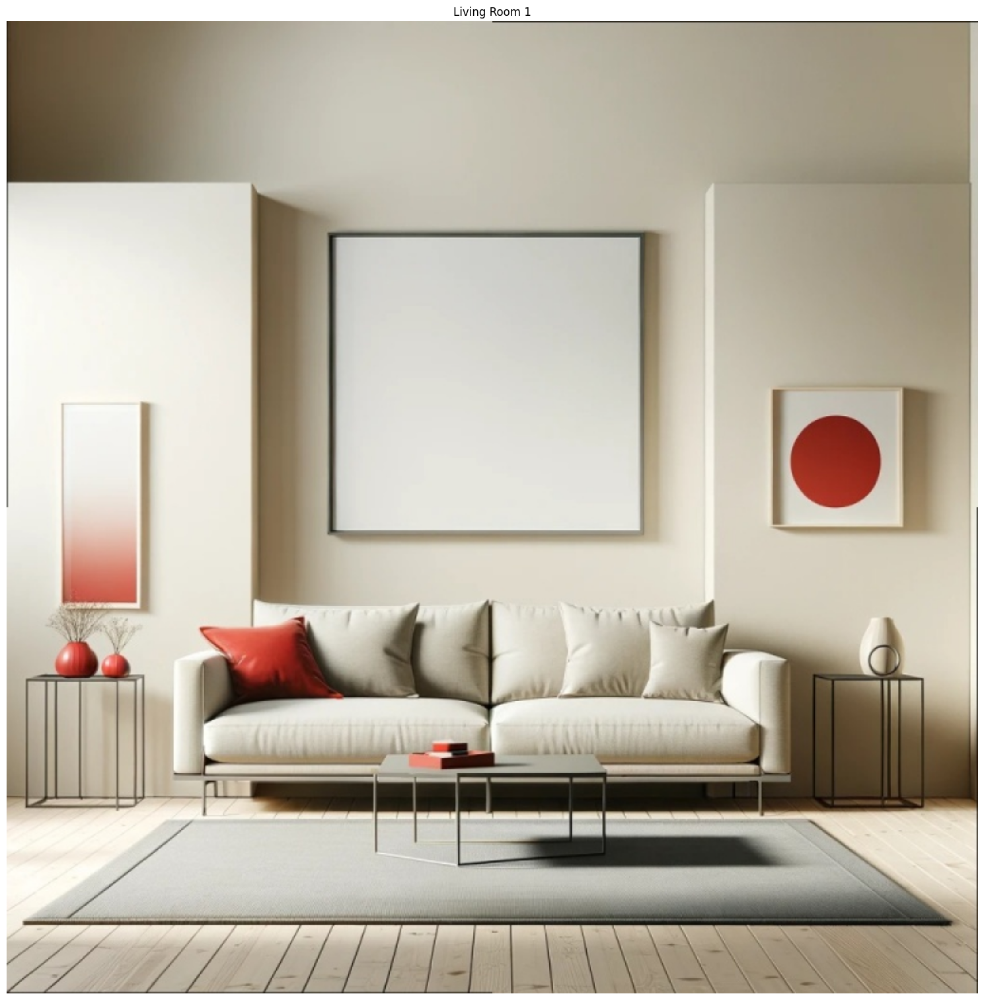

In [20]:
# skimage.io.imread() reads images in rgb format
living_room_image1 = io.imread(living_room_image1_path)

# Resizing
imageHeight = living_room_image1.shape[0]
ratioHeight = imageHeight / 1024
living_room_image1 = cv2.resize(living_room_image1, (int(living_room_image1.shape[1]/ratioHeight),1024), interpolation = cv2.INTER_AREA)

# Sometimes images also have a 4th channel for transparency, we remove this to avoid unexpected results
if (living_room_image1.shape[2] == 4):
  living_room_image1 = living_room_image1[:, :, :3]

imshow([living_room_image1], ['Living Room 1'])

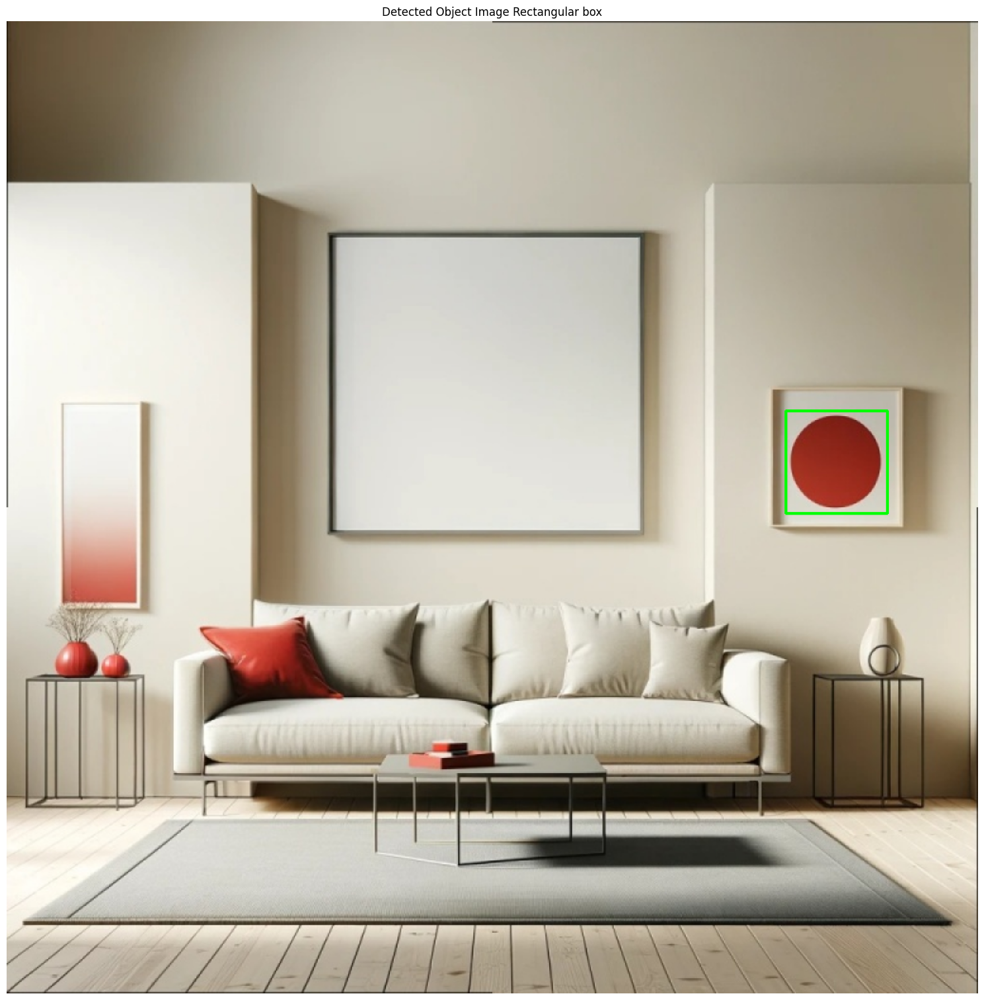

In [21]:
# Generating object detections within rectangular bounding boxes and displaying the detections
red_rectangular_object_detections, red_colour_mask = detect_object_according_to_colour(living_room_image1, 'red', 'rect', 8000, 15000)
display_detected_objects(living_room_image1, red_rectangular_object_detections, 'rect')

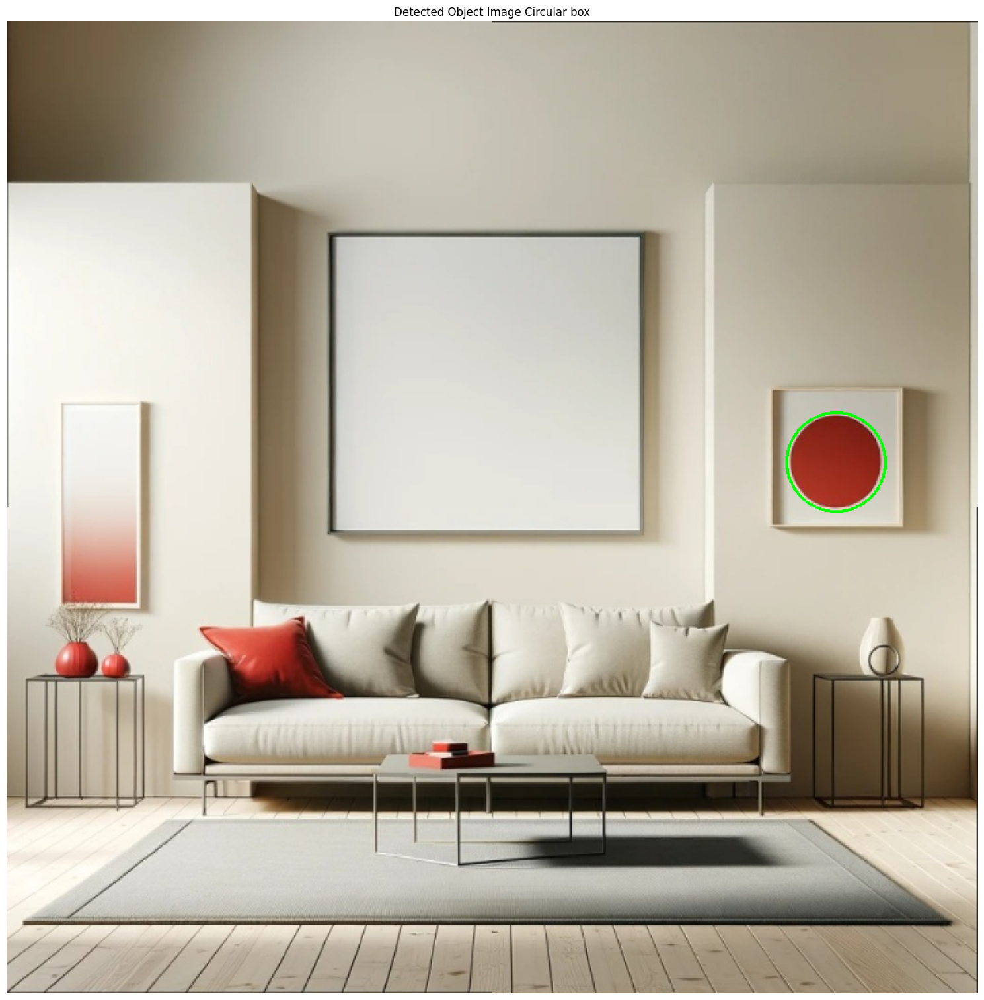

In [22]:
# Generating object detections within circular boundaries and displaying the detections
red_circular_object_detections, red_colour_mask = detect_object_according_to_colour(living_room_image1, 'red', 'circle', 8000, 15000)
display_detected_objects(living_room_image1, red_circular_object_detections, 'circle')

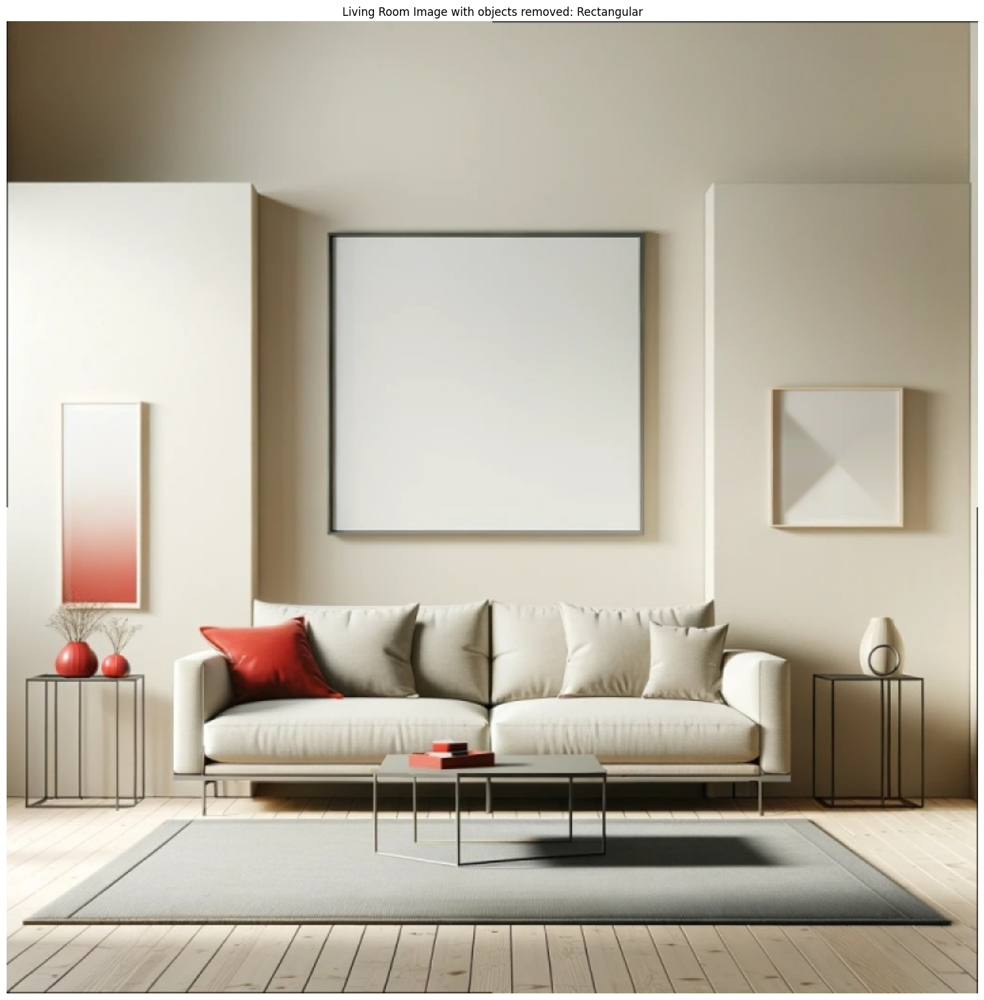

In [23]:
# Performing in-painting for objects detected in rectangular bounding boxes
living_room_image1_objects_removed_rectangular = remove_object_from_image(living_room_image1, red_rectangular_object_detections, 'rect')
imshow([living_room_image1_objects_removed_rectangular], ['Living Room Image with objects removed: Rectangular'])

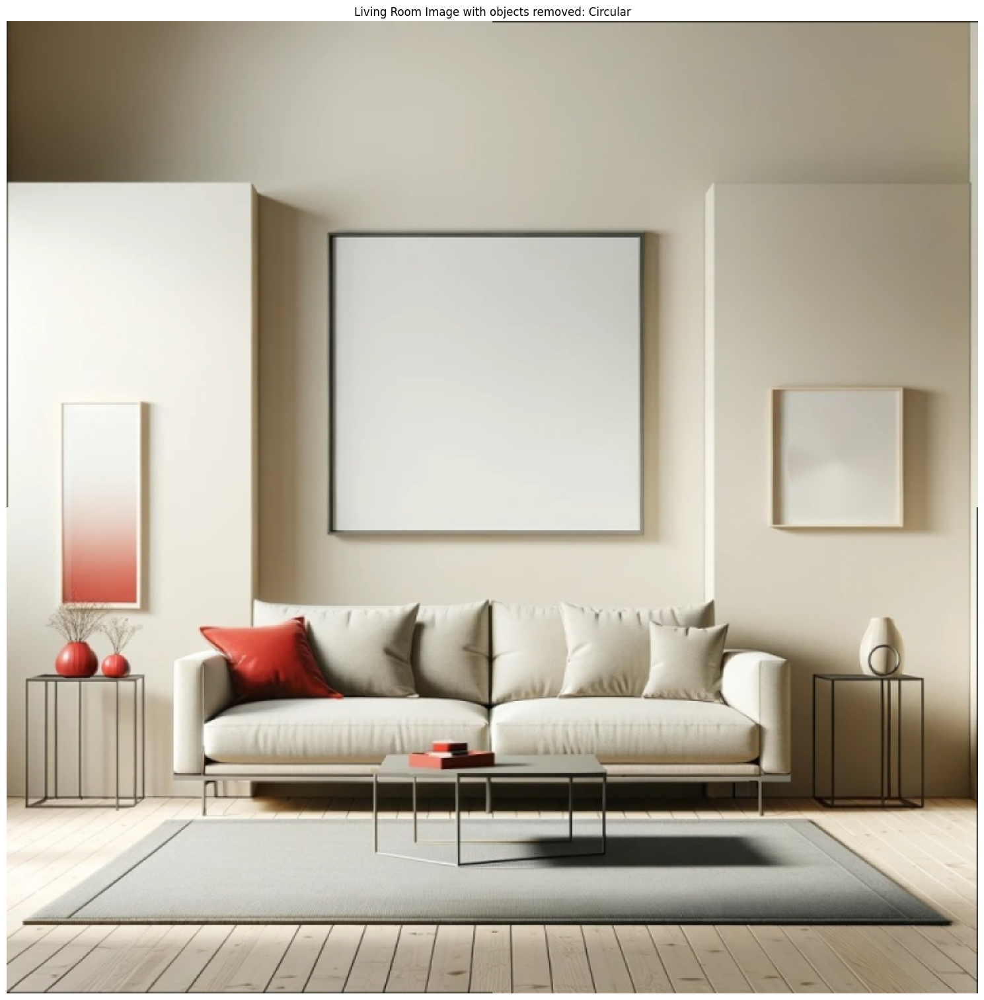

In [24]:
# Performing in-painting for objects detected in rectangular bounding boxes
# Note the difference between the two in-paintings
living_room_image1_objects_removed_circular = remove_object_from_image(living_room_image1, red_circular_object_detections, 'circle')
imshow([living_room_image1_objects_removed_circular], ['Living Room Image with objects removed: Circular'])

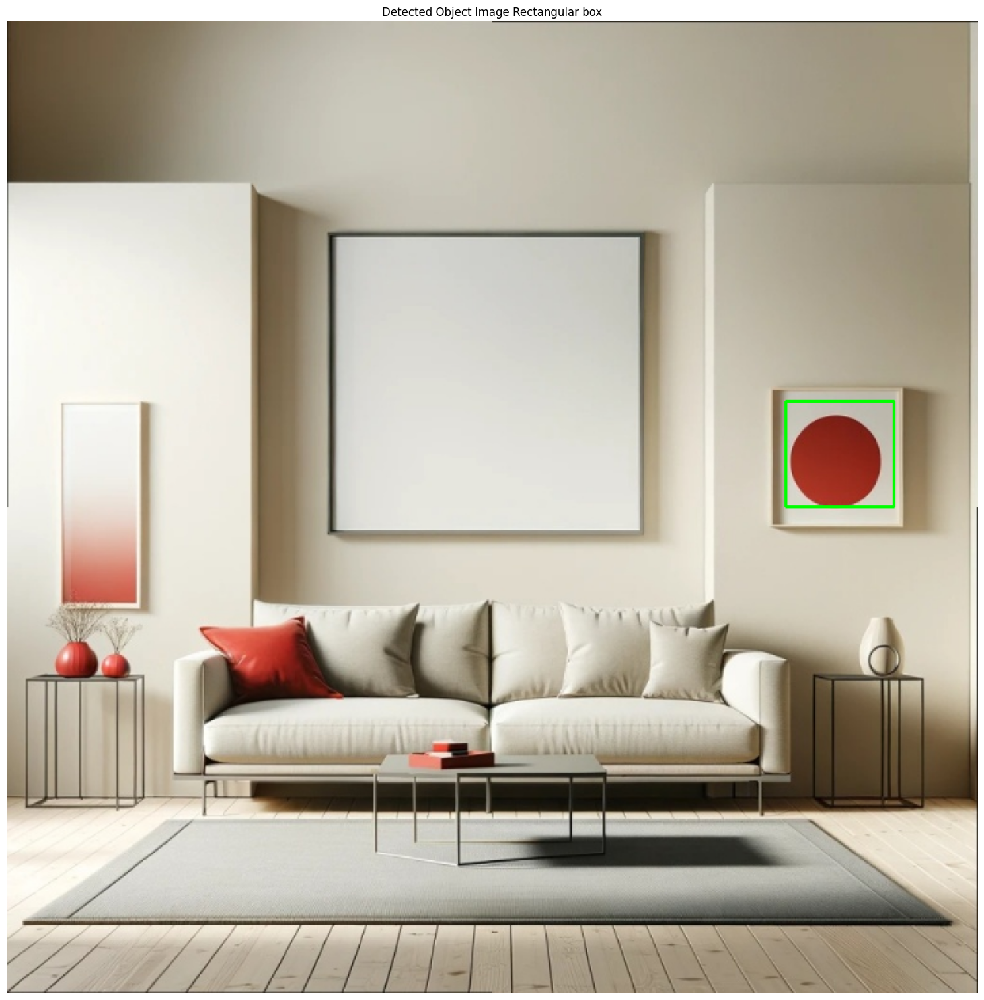

In [25]:
# Improving the rectangular bounded detections for better in-painting
improved_red_rectangular_detections = improve_detections(living_room_image1, red_rectangular_object_detections, 'red')
display_detected_objects(living_room_image1, improved_red_rectangular_detections, 'rect')

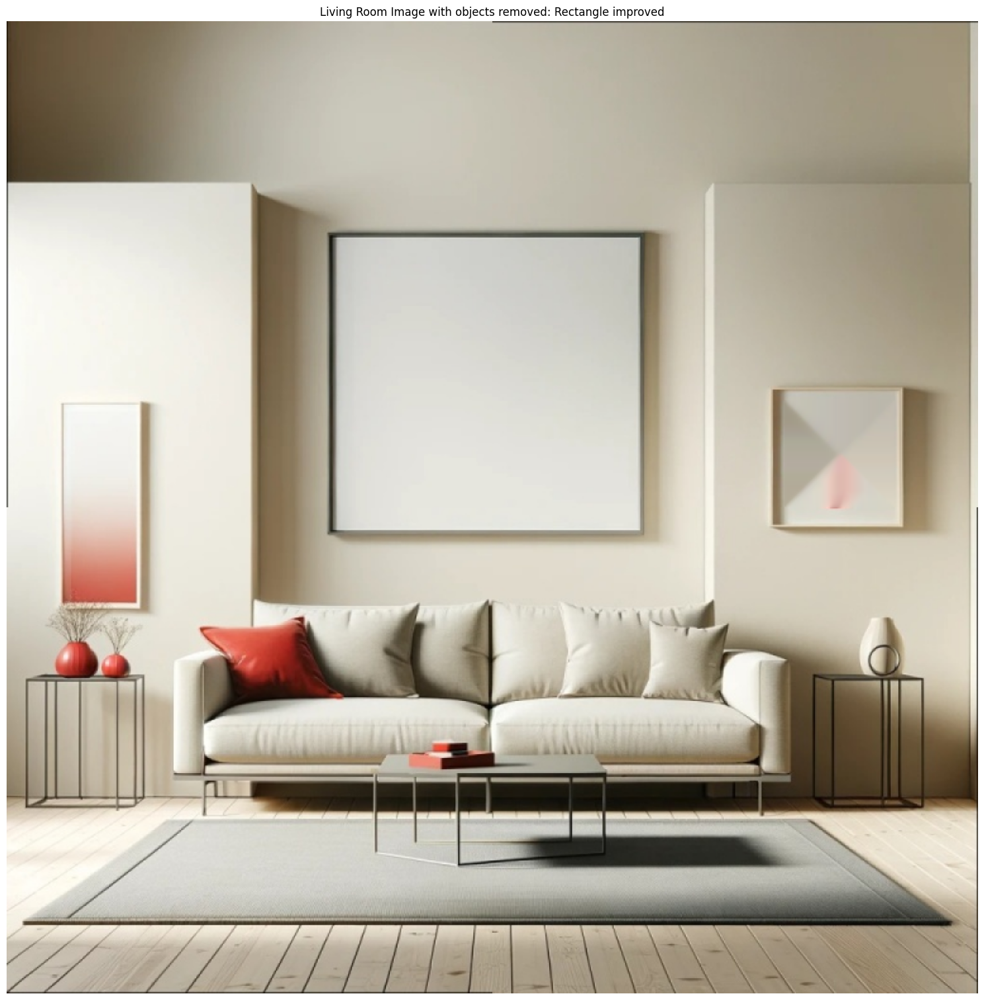

In [26]:
# Performing in-painting for objects detected in rectangular bounding boxes for improved detections
# Note the difference in the quality of in-painting between the normal and improved detections
living_room_image1_objects_removed_rectangular_improved = remove_object_from_image(living_room_image1, improved_red_rectangular_detections, 'rect')
imshow([living_room_image1_objects_removed_rectangular_improved], ['Living Room Image with objects removed: Rectangle improved'])

In [27]:
# Writing the circular bounded detections to a file
# This file will be used to model the virtual environment
write_object_detections_to_text_file(red_circular_object_detections, object_detections_file_path)

# Writing the in-painted image to a file
# This file will also be used in the modeling of the virtual environment

# Resizing
imageHeight = living_room_image1_objects_removed_circular.shape[0]
ratioHeight = imageHeight / 768
living_room_image1_objects_removed_circular = cv2.resize(living_room_image1_objects_removed_circular, (int(living_room_image1_objects_removed_circular.shape[1]/ratioHeight),768), interpolation = cv2.INTER_AREA)

io.imsave(object_removed_image_file_path, living_room_image1_objects_removed_circular)